In [1]:
import torch; torch.manual_seed(0)
import torch.nn as nn
import torch.nn.functional as F
import torch.utils
import torch.distributions
import torchvision
import numpy as np
import torchvision.models as models 
from torchvision import transforms, utils
from torch.utils.data.sampler import SubsetRandomSampler
import torch.optim as optim
import matplotlib.pyplot as plt
import latent_plot as lp
from torch.autograd import Variable
from torch.optim import lr_scheduler
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
import copy
#from model import VAE

import matplotlib.pyplot as plt; plt.rcParams['figure.dpi'] = 200
from data_loader import FundusDataLoader

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [3]:
csv_path = '/home/vip/sayan-mandal/datasets/obj_criteria/20200619-objective.csv'
img_path = '/home/vip/sayan-mandal/datasets/obj_criteria/good_reduced/'

ResizeParam = 128
FD = FundusDataLoader(csv_path, img_path,transform=transforms.Compose([transforms.Resize(ResizeParam), transforms.RandomHorizontalFlip(p=0.5) ,transforms.ToTensor()]))
FD2 = FundusDataLoader(csv_path, img_path,transform=transforms.Compose([transforms.Resize(ResizeParam), transforms.ToTensor()]))

#random sampler
batch_size = 32
validation_split = .2
shuffle_dataset = True
random_seed= 42

# Creating data indices for training and validation splits:
dataset_size = len(FD)
indices = list(range(dataset_size))
split = int(np.floor(validation_split * dataset_size))
if shuffle_dataset :
    np.random.seed(random_seed)
    np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

# Creating PT data samplers and loaders:
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

train_loader = torch.utils.data.DataLoader(FD, batch_size=batch_size, sampler=train_sampler)
validation_loader = torch.utils.data.DataLoader(FD2, batch_size=batch_size, sampler=valid_sampler)


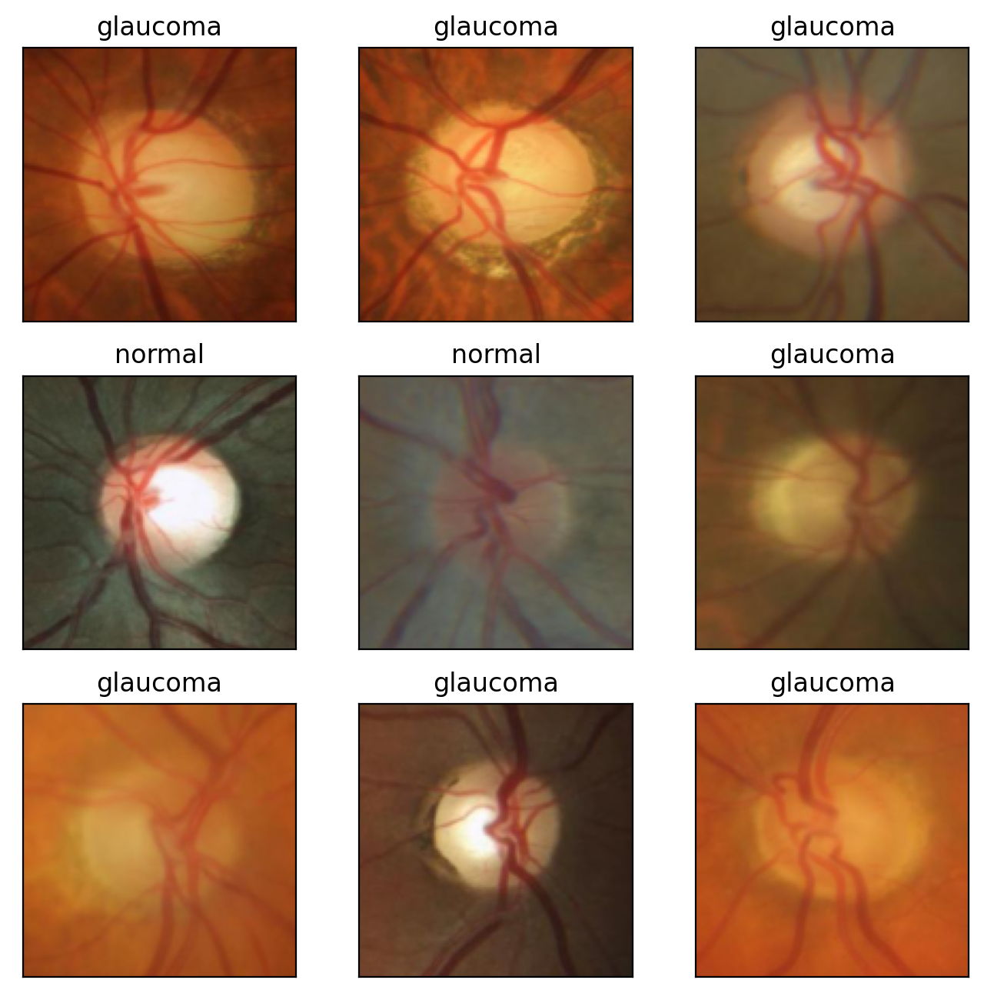

In [4]:
#Utility functions to un-normalize and display an image
def imshow(img):
    #img = img / 2 + 0.5  
    plt.imshow(np.transpose(img, (1, 2, 0))) 

 
#Define the image classes
classes = ['normal','glaucoma']

#Obtain one batch of training images
dataiter = iter(train_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display

#Plot the images
fig = plt.figure(figsize=(8, 8))
# display 20 images
for idx in np.arange(9):
    ax = fig.add_subplot(3, 3, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    ax.set_title(classes[labels[idx]])

In [5]:
#implemented from
vggnet = models.__dict__['vgg19'](pretrained=True)
for param in vggnet.features.parameters():
    param.require_grad = False

#extract features from vgg123 layers
class VGG(nn.Module):
    def __init__(self, vggnet):
        super(VGG, self).__init__()
        self.conv1_1 = vggnet.features[0]
        self.conv1_2 = vggnet.features[2]
        self.conv2_1 = vggnet.features[5]
        self.conv2_2 = vggnet.features[7]
        self.conv3_1 = vggnet.features[10]
        
        self.max1 = vggnet.features[4]
        self.max2 = vggnet.features[9]

    def forward(self, x):
        out1 = F.relu(self.conv1_1(x), inplace=True)
        x = F.relu(self.conv1_2(out1), inplace=True)
        x = self.max1(x)
        out2 = F.relu(self.conv2_1(x), inplace=True)
        x = F.relu(self.conv2_2(out2), inplace=True)
        x = self.max2(x)
        out3 = F.relu(self.conv3_1(x), inplace=True)

        return out1, out2, out3



In [6]:
def layer_loss(pred,target):
    loss = torch.sum((pred-target).pow(2), dim=[1,2,3])
    return loss

def vggloss(x_rec, x_true, vggfeatures):
    out1_rec, out2_rec, out3_rec = vggfeatures(x_rec)
    out1_true, out2_true, out3_true = vggfeatures(x_true)

    loss1 = layer_loss(out1_rec, out1_true)
    loss2 = layer_loss(out2_rec, out2_true)
    loss3 = layer_loss(out3_rec, out3_true)
    loss = torch.mean(loss1 + loss2 + loss3)

    return loss

In [7]:
#kl divergence loss
#lossfunc = F.mse_loss(y,x)

def criterion(y, x, mu, logvar, vggfeatures, alpha = 1, beta = 1):
    # feature loss
    recon = vggloss(y,x,vggfeatures)
    #recon = F.mse_loss(y,x, reduction = 'sum')
    # kl divergence between Q(z|x) ~ N(mu, sigma) and P(z) ~ N(0, I)
    kl = torch.mean(-0.5*torch.sum(1+logvar-mu.pow(2) - logvar.exp()))
    #kl/= y.shape[0]*y.shape[1]*y.shape[2]*y.shape[3]
    return (alpha * recon + beta * kl), recon, kl

In [8]:


class convVAE(nn.Module):
    def __init__(self, in_shape, n_latent):
        super(convVAE, self).__init__()
        self.in_shape = in_shape
        self.lin_shape = 16
        self.n_latent = n_latent
        c,h,w = in_shape
        self.z_dim = h//2**2 # receptive field downsampled 3 times
        self.encoder = nn.Sequential(
            nn.Conv2d(c, 16, kernel_size=3, stride=1, padding=1),  # 16, 128, 128
            nn.BatchNorm2d(16),
            nn.LeakyReLU(),
            nn.Conv2d(16, 32, kernel_size=3, stride=2, padding=1),  # 32, 64, 64
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),  # 64, 64, 64
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.Conv2d(64, self.lin_shape, kernel_size=3, stride=2, padding=1),  # 16, 32, 32
            nn.BatchNorm2d(self.lin_shape),
            nn.LeakyReLU(),
            nn.Flatten()
        )
        self.fc1 = nn.Sequential(
            nn.Linear(self.lin_shape * (self.z_dim)**2, 2048*2),
            nn.BatchNorm1d(2048*2),
            nn.LeakyReLU(),
            nn.Linear( 2048*2,n_latent),
            nn.BatchNorm1d(n_latent),
            nn.LeakyReLU(),
        )
        self.fc21 = nn.Sequential(
            nn.Linear(n_latent, n_latent),
        )
        self.fc22 = nn.Sequential(
            nn.Linear(n_latent, n_latent),
        )

        self.fc3 = nn.Sequential(
            nn.Linear(n_latent, n_latent*2),
            nn.BatchNorm1d(n_latent*2),
            nn.LeakyReLU(),
            nn.Linear(n_latent*2, self.lin_shape * (self.z_dim)**2),
            nn.BatchNorm1d(self.lin_shape * (self.z_dim)**2),
            nn.LeakyReLU(),
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(self.lin_shape, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(32, 16, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(16),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(16, 3, kernel_size=3, stride=1, padding=1),
            nn.Sigmoid()
        )

    def sample_z(self, mean, logvar):
        stddev = logvar.mul(0.5).cuda()
        noise = Variable(torch.randn(*mean.size())).cuda()
        return (noise * stddev) + mean

    def bottleneck(self, h):
        h = self.fc1(h)
        mean, logvar = self.fc21(h), self.fc22(h)
        z = self.sample_z(mean, logvar)
        return z, mean, logvar

    def encode(self, x):
        x = self.encoder(x)
        z, mean, logvar = self.bottleneck(x)
        return z, mean, logvar

    def decode(self, z):
        out = self.fc3(z)
        out = out.view(out.shape[0], self.lin_shape, self.z_dim,self.z_dim)
        out = self.decoder(out)
        return out

    def forward(self, x):
        z,mean, logvar = self.encode(x)
        out = self.decode(z)
        return out, mean, logvar

In [9]:
#vae model structure
model = convVAE((3,128,128),4096).cuda()
print(model)

convVAE(
  (encoder): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
    (9): Conv2d(64, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): LeakyReLU(negative_slope=0.01)
    (12): Flatten(start_dim=1, end_dim=-1)
  )
  (fc1): Sequential(
    (0): Linear(in_features=16384, out_features=4096, bias=True)
    (1): BatchNo

In [10]:
#vgg feature model structure
vgg123 = VGG(vggnet).eval()
if torch.cuda.is_available(): vgg123 = vgg123.cuda()

print(vgg123)


VGG(
  (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (max1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (max2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
)


In [11]:
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
#optimizer = torch.optim.SGD(model.parameters(), lr = 0.01, momentum=0.9)
scheduler = lr_scheduler.StepLR(optimizer, step_size = 140, gamma = 0.1)
epochs = 160
#beta_vals = np.linspace(0,1,20)

ep,lss,kll,bcel, vlss,vkll,vbcel = [],[],[],[],[],[],[]
best_loss = float('inf')
for e in range(epochs):
    model.train()
    tr_loss = tr_bce = tr_kld = 0
    for batch_idx, (data, _) in enumerate(train_loader):
        data = Variable(data).cuda()
        optimizer.zero_grad()
        y, mu, sig = model(data) # y = reconstructed image
        loss,bce,kld = criterion(y, data, mu, sig, vgg123)
        loss.backward()
        optimizer.step()
        tr_loss += loss.item()
        tr_bce += bce.item()
        tr_kld += kld.item()

    #validation
    model.eval()
    val_loss = val_bce = val_kld = 0
    with torch.no_grad():
        for data, _ in validation_loader:
            data = Variable(data).cuda()
            y, mu, sig = model(data)
            loss,bce,kld = criterion(y, data, mu, sig,vgg123)
            val_loss += loss.item()
            val_bce += bce.item()
            val_kld += kld.item()

    if val_loss < best_loss:
        best_loss = val_loss
        best_e = e
        best_model = copy.deepcopy(model)

    scheduler.step()
        
    to_print = "Epoch[{}/{}], Train Loss: {:.4f} {:.4f} {:.4f} | Valid Loss: {:.4f} {:.4f} {:.4f}".format(e+1, 
                                epochs, tr_loss/(dataset_size*0.8), tr_bce/(dataset_size*0.8), tr_kld/(dataset_size*0.8), val_loss/(dataset_size*0.2), val_bce/(dataset_size*0.2), val_kld/(dataset_size*0.2))
    print(to_print)
    ep += [e]
    lss += [tr_loss/(dataset_size*0.8)]
    kll += [tr_kld/(dataset_size*0.8)]
    bcel += [tr_bce/(dataset_size*0.8)]
    vlss += [val_loss/(dataset_size*0.2)]
    vkll += [val_kld/(dataset_size*0.2)]
    vbcel += [val_bce/(dataset_size*0.2)]

Epoch[1/160], Train Loss: 5169.3332 4777.7240 391.6092 | Valid Loss: 3944.2469 3856.0185 88.2284
Epoch[2/160], Train Loss: 3846.6080 3771.1771 75.4308 | Valid Loss: 3791.3812 3705.5084 85.8729
Epoch[3/160], Train Loss: 3671.5957 3552.0616 119.5340 | Valid Loss: 3458.9134 3409.1445 49.7689
Epoch[4/160], Train Loss: 3455.7482 3390.1407 65.6075 | Valid Loss: 3353.4381 3305.3357 48.1024
Epoch[5/160], Train Loss: 3358.4790 3301.8679 56.6111 | Valid Loss: 3308.5663 3243.7879 64.7784
Epoch[6/160], Train Loss: 3296.5185 3247.2177 49.3008 | Valid Loss: 3227.7122 3180.4315 47.2808
Epoch[7/160], Train Loss: 3221.1449 3181.1287 40.0162 | Valid Loss: 3201.7487 3136.9894 64.7593
Epoch[8/160], Train Loss: 3183.0460 3144.8798 38.1662 | Valid Loss: 3087.3251 3062.8284 24.4967
Epoch[9/160], Train Loss: 3132.3779 3105.9758 26.4021 | Valid Loss: 3043.3705 3028.0553 15.3151
Epoch[10/160], Train Loss: 3103.2342 3082.4901 20.7441 | Valid Loss: 3059.3108 3047.3283 11.9825
Epoch[11/160], Train Loss: 3086.0957 

3508094.8671875 158


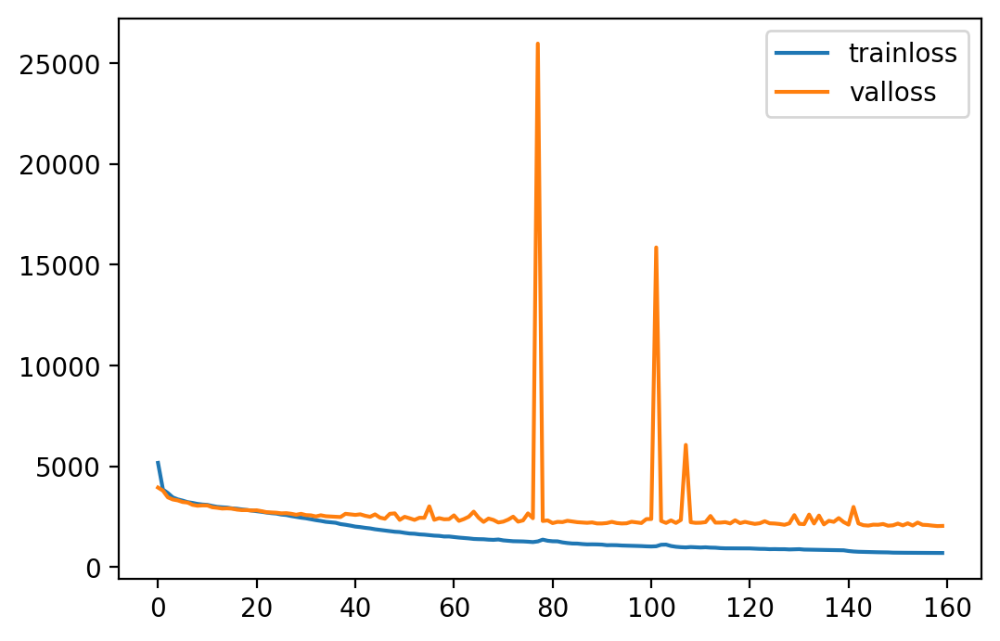

In [12]:
print(best_loss, best_e)
plt.plot(ep, lss, label = 'trainloss')
plt.plot(ep,vlss, label = 'valloss')
plt.legend()
plt.show()

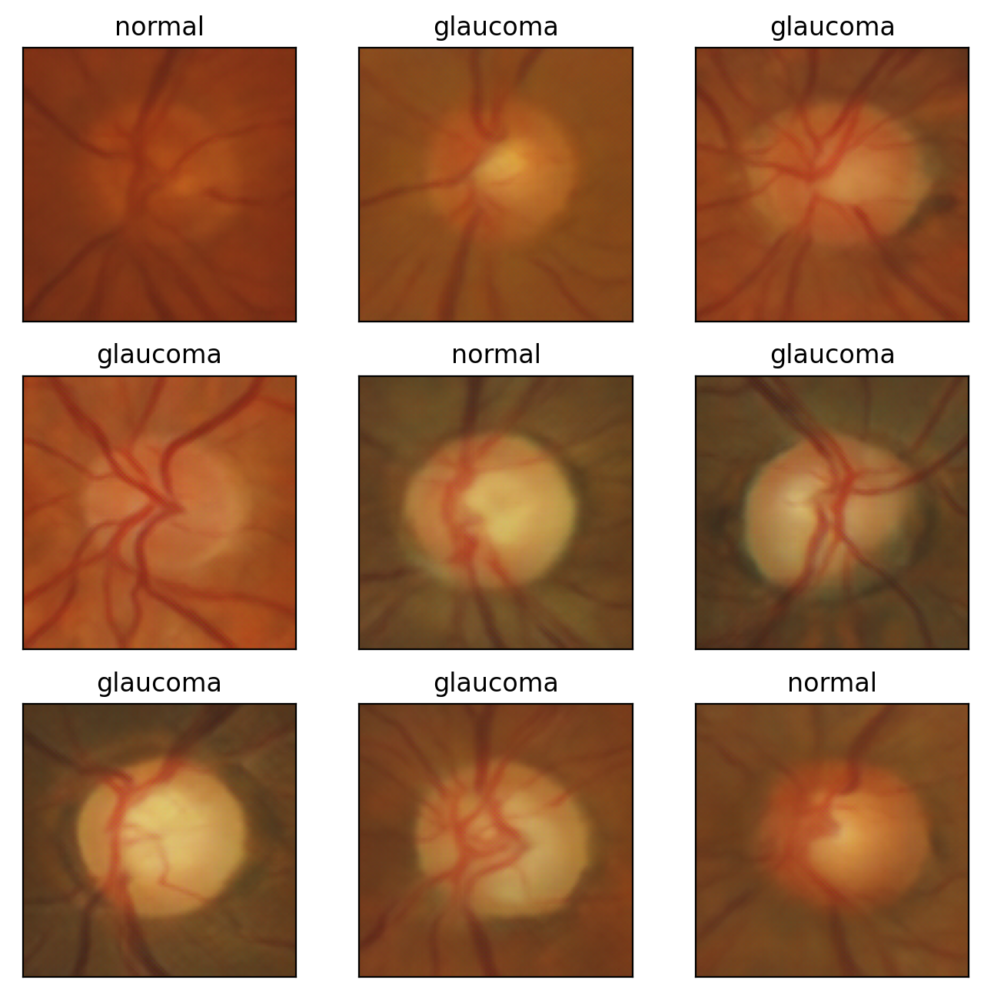

In [13]:
#Obtain one batch of training images
dataiter = iter(train_loader)
data, labels = dataiter.next()
best_model.eval()
images,_,_ = best_model(Variable(data).cuda())
images = images.detach().cpu().numpy() # convert images to numpy for display

#Plot the images
fig = plt.figure(figsize=(8, 8))
# display 20 images
for idx in np.arange(9):
    ax = fig.add_subplot(3, 3, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    ax.set_title(classes[labels[idx]])

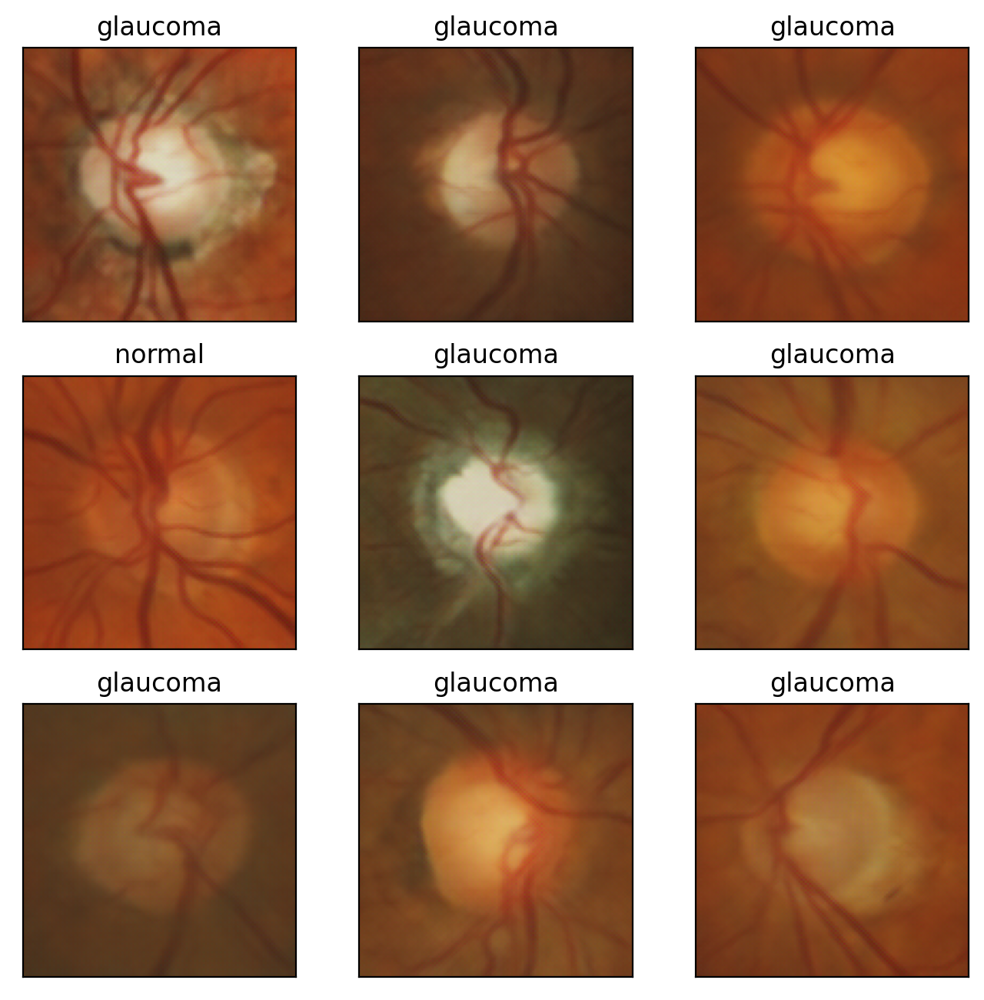

In [14]:
#Obtain one batch of training images
dataiter = iter(train_loader)
data, labels = dataiter.next()
model.eval()
images,_,_ = model(Variable(data).cuda())
images = images.detach().cpu().numpy() # convert images to numpy for display

#Plot the images
fig = plt.figure(figsize=(8, 8))
# display 20 images
for idx in np.arange(9):
    ax = fig.add_subplot(3, 3, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    ax.set_title(classes[labels[idx]])

In [15]:
from sklearn.manifold import TSNE

n_comp = 2
perplexity = 30

In [16]:

for i, (data,label) in enumerate(train_loader):
    y, _,_ =  best_model.encode(Variable(data).cuda())
    y = y.cpu().detach().numpy()
    if i == 0:
        yd = y
        lbl = label.numpy()
    else:
        yd = np.append(yd,y,axis=0)
        lbl = np.append(lbl,label.numpy(), axis=0)

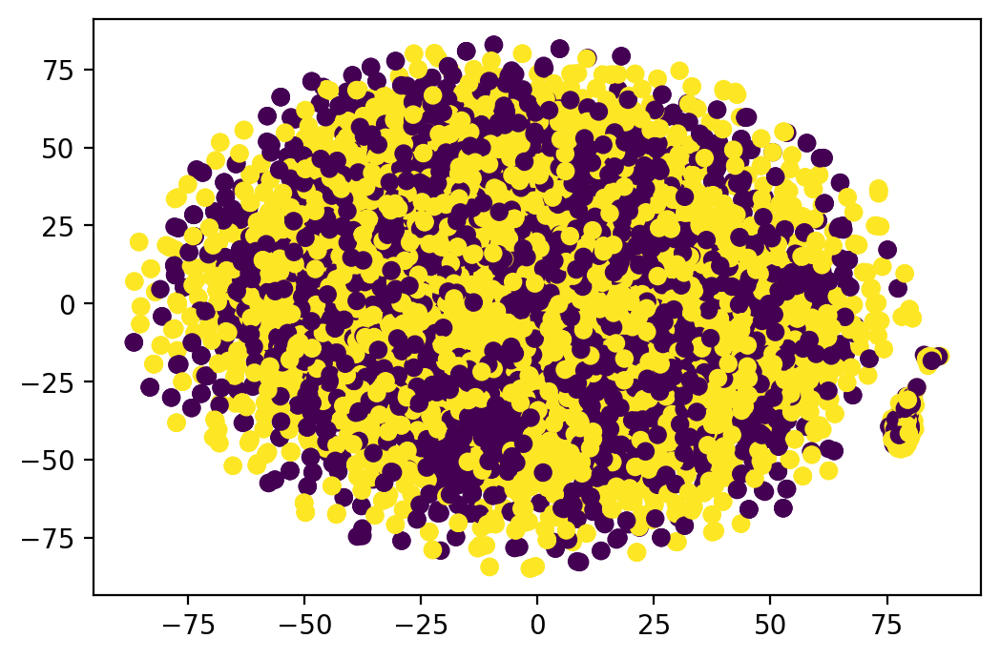

In [17]:
y_embed = TSNE(n_components=n_comp, perplexity=perplexity).fit_transform(yd)
#labels = ['normal','glaucoma']
plt.scatter(y_embed[:,0],y_embed[:,1],c=lbl)
plt.show()

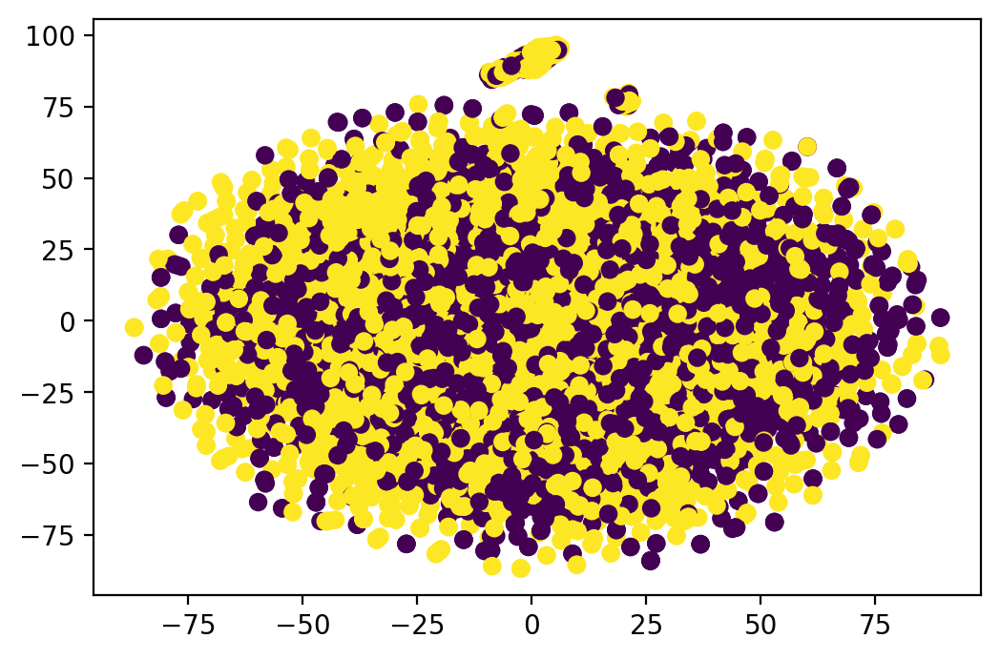

In [18]:

for i, (data,label) in enumerate(train_loader):
    y, _,_ =  model.encode(Variable(data).cuda())
    y = y.cpu().detach().numpy()
    if i == 0:
        yd = y
        lbl = label.numpy()
    else:
        yd = np.append(yd,y,axis=0)
        lbl = np.append(lbl,label.numpy(), axis=0)

y_embed = TSNE(n_components=n_comp, perplexity=perplexity).fit_transform(yd)
#labels = ['normal','glaucoma']
plt.scatter(y_embed[:,0],y_embed[:,1],c=lbl)
plt.show()

In [19]:
torch.save(best_model.state_dict(), 'dfcvae_inp128_nl4096_a1b1.torch')

In [20]:
import smtplib, ssl

port = 587  # For starttls
smtp_server = "smtp.gmail.com"
sender_email = "vipmlnotifs@gmail.com"
receiver_email = "sayanmndl21@gmail.com"
password = "vip2019!"#input("Type your password and press enter:")
message = """\
Subject: Training Status

Done!!"""

context = ssl.create_default_context()
with smtplib.SMTP(smtp_server, port) as server:
    server.ehlo()  # Can be omitted
    server.starttls(context=context)
    server.ehlo()  # Can be omitted
    server.login(sender_email, password)
    server.sendmail(sender_email, receiver_email, message)